## PW on graphcut optimization (binary case)
This session is divided into 3 parts:


* a part on Bayesian classification (see PW1 and PW2)
* a part on object/background segmentation of a colour image with a CRF (conditional random filed)
* a part on the iterative segmentation of a textured image

We will use the PyMaxflow library for the calculation of the graphcut.

In [1]:
import math
import random
import numpy as np
import matplotlib.pyplot as plt
import platform
import tempfile
import os
import maxflow
from scipy import ndimage as ndi
from skimage import io
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook
import imageio

output_notebook()

def display_segmentation_borders(image, bin):
    imagergb = np.copy(image)
    from skimage.morphology import binary_dilation, disk
    contour = binary_dilation(bin, disk(15)) ^ bin
    imagergb[contour == 1, 0] = 255
    imagergb[contour == 1, 1] = 0
    imagergb[contour == 1, 2] = 0
    return imagergb

Loading BokehJS ...

In [2]:
def affiche_pour_colab(im, MINI=None, MAXI=None, titre=''): #special colab, don't look
  def normalise_image_pour_bokeh(X, MINI, MAXI):
    if MAXI == None:
      MAXI = np.max(X)
    if MINI == None:
      MINI = np.min(X)
    imt = np.copy(X.copy())
    imt = (np.clip(imt,MINI,MAXI)/(MAXI-MINI))
    imt[imt<0] = 0
    imt[imt>1] = 1
    imt *= 255
    sortie=np.empty((*imt.shape,4),dtype=np.uint8)
    for k in range(3):
      sortie[:,:,k]=imt
    sortie[:,:,3]=255
    return sortie

  img = im
  img = normalise_image_pour_bokeh(np.flipud(im), MINI, MAXI)
  p = figure(tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")], y_range=[0, im.shape[0]], x_range=[0, im.shape[1]])
  # p.x_range.range_padding = p.y_range.range_padding = 0
  # must give a vector of images
  p.image(image=[np.flipud(im)], x=0, y=0, dw=im.shape[1], dh=im.shape[0], palette="Greys9", level="image")
  p.xgrid.visible = False
  p.ygrid.visible = False
  showbokeh(p)

def affiche(im,MINI=0.0, MAXI=None,titre='',printname=False):
  affiche_pour_colab(im, MINI=MINI, MAXI=MAXI, titre=titre) # under google colab many options disappear

## Binary classification of a noisy image

You have a binary image *IoriginaleBW.png* (binary image of the two classes) and its observed version with a certain distribution of grey levels for each class *Iobservee.png*. The objective is to perform a two-class classification of this observed image (see PW1 and PW2).

### Analysis of the distributions of the 2 classes of the image}


Q1: What are the distributions of the two classes of the image ($P(Y_s|X_s=0)$ (black class) and $P(Y_s|X_s=1)$ (white class))?

Q2: Give the means and variances of the two classes (CF. code of Q8).

*The distributions and the means and variances found in the previous sessions will be used without justification*.

**Your answer &#x270D;**

A1: The two classes follow Gaussian distributions:

$$
P(Y_s \mid X_s = 0) \sim \mathcal{N}(\mu_0, \sigma_0^2)
$$

$$
P(Y_s \mid X_s = 1) \sim \mathcal{N}(\mu_1, \sigma_1^2)
$$

A2: $ \mu_0 = 100, \;\sigma_0^2 = 500$ for black and $ \mu_1 = 150, \;\sigma_1^2 = 500$ for white.

## 1.1: Graphcut optimization

Q3: How many nodes does the graph have that is constructed for the search for the minimum capacity cut with only two neighbouring pixels? What do they correspond to? What do the data attachment terms in this graph correspond to and what values do they have for two observed pixels of values $y_s$ and $y_t$? What does the regularisation term correspond to?

**Your answer &#x270D;**

A3: The graph consists of $n+2$ nodes: $n$ nodes corresponding to the pixels, one node representing the source, and one node representing the sink. The data attachment terms correspond to the arcs connecting the source to each pixel and each pixel to the sink. The regularization term corresponds to the arcs between the neighboring pixels, representing the smoothness or consistency constraint between their values.

Q4: Complete the python code cell where it says "#TO BE COMPLETED EX1" with the data attachment and regularization terms as indicated. Run the minimum cut algorithm and view the result.

## 1.2 Searching for the optimal $\beta$.



Q5: By completing the program frame provided below, find the optimal $\beta$ value $\beta_{opt}$ using the "true image" $x$ corresponding to IoriginaleBW.png. You can plot the error values between $x$ and the estimated $\hat{x}$ to find $\beta_{opt}$.



**Your answer &#x270D;**

A5: By plotting the error curve, we find that the optimal value of $\beta$, $\beta_{opt}$, is 1676. This value balances the trade-off between the data fidelity term and the regularization term.

Q6: What are the advantages of this optimization approach compared to ICM? Compared to simulated annealing? In theory, do we obtain the same result with both methods (simulated annealing and graphcut)? Under what conditions? What is the advantage of simulated annealing in the general case?

**Your answer &#x270D;**

A6:The graph-cut approach is generally more accurate than ICM, which tends to converge to a local minimum, making the result highly dependent on initialization, even if ICM converges quickly. Additionally, graph-cut is faster than simulated annealing. Simulated annealing, on the other hand, converges to a global minimum, but its convergence is slower because the temperature decreases very gradually.

In theory, both simulated annealing and graph-cut can reach the global minimum. However, graph-cut only guarantees the global minimum for specific types of energy functions. The advantage of simulated annealing is its ability to find the global minimum regardless of the energy function, while graph-cut is much faster and is effective for well-defined energy structures. The choice between these methods depends on the specific problem characteristics: simulated annealing excels in general global optimization, whereas graph-cut is efficient for certain predefined energy functions.


Q7: If we get different results between ICM and graph-cut, or between simulated annealing and graph-cut (if the conditions for the simulated annealing to give the global minima are not respected), how can you explain that the error rate with the true image can be lower with the ICM result of the simulated annealing one than with the graph-cut optimization?
  

**Your answer &#x270D;**

A7: ICM and simulated annealing explore a broader range of possible solutions compared to graph-cut. This flexibility allows them to potentially find a solution closer to the true optimum under certain conditions, which can explain the lower error rate with the true image in some cases.

Q8: What are the advantages and disadvantages of the Ising model?

**Your answer &#x270D;**

A8: The Ising model provides a simple and straightforward framework that is easy to implement. One of its key advantages is that it allows for finding a global optimum when combined with graph-cut optimization. However, a significant drawback is that it favors images with completely black or completely white regions, which can lead to unrealistic results when the parameter $\beta$ is very large.

While the simplicity of the model is an advantage, it struggles with preserving fine details such as edges and complex, curved shapes. This limitation makes the model less effective in scenarios requiring detailed or nuanced segmentation

In [3]:
# Loading images
im_obs = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation

affiche(im_obs)

In [4]:
affiche(im_orig)

In [5]:
# TO BE COMPLETED EX1
# /!\ beta, m0, and m1 must be floats to avoid some issues. For example: "beta = 1.".
beta = 1000  # Example value, replace with the correct one
m0 = 100.0  # Example value for m0, replace with the value from the previous practical work
m1 = 150.0  # Example value for m1, replace with the value from the previous practical work

# Observed image (im_obs) must be defined before this code snippet.
# For example:
# im_obs = np.array([[...]])  # Replace with the actual observed image data

# Ensure im_obs is defined
assert 'im_obs' in globals(), "im_obs is not defined. Define it as the observed image data."

## binary graph-cut

# Create the graph.
g = maxflow.Graph[float]()  # Graph instantiation

# Add the nodes.
# nodeids has the identifiers of the nodes in the grid.
# It creates a set of nodes for all the pixels of the image
nodeids = g.add_grid_nodes(im_obs.shape)

# Add non-terminal edges with the same capacity.
# The edge has the value beta for all adjacent pixels in 4-connectivity
g.add_grid_edges(nodeids, beta)

# Compute data attachment terms
# Us0 corresponds to -log(P(Ys | Xs = 0))
# Us1 corresponds to -log(P(Ys | Xs = 1))
map_Us_0 = (im_obs - m0) ** 2 # Replace this with the actual calculation for Us0
map_Us_1 = (im_obs - m1) ** 2 # Replace this with the actual calculation for Us1

# Add the terminal edges.
# The second argument corresponds to the set of edge values to the source
# The third argument corresponds to the set of edge values to the sink
g.add_grid_tedges(nodeids, map_Us_0, map_Us_1)

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))

# Get the labels of the nodes in the grid.
# output is 0 if the node is connected to the source, else output is 1
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

Max Flow: 84628529.0


In [6]:
affiche(im_bin)

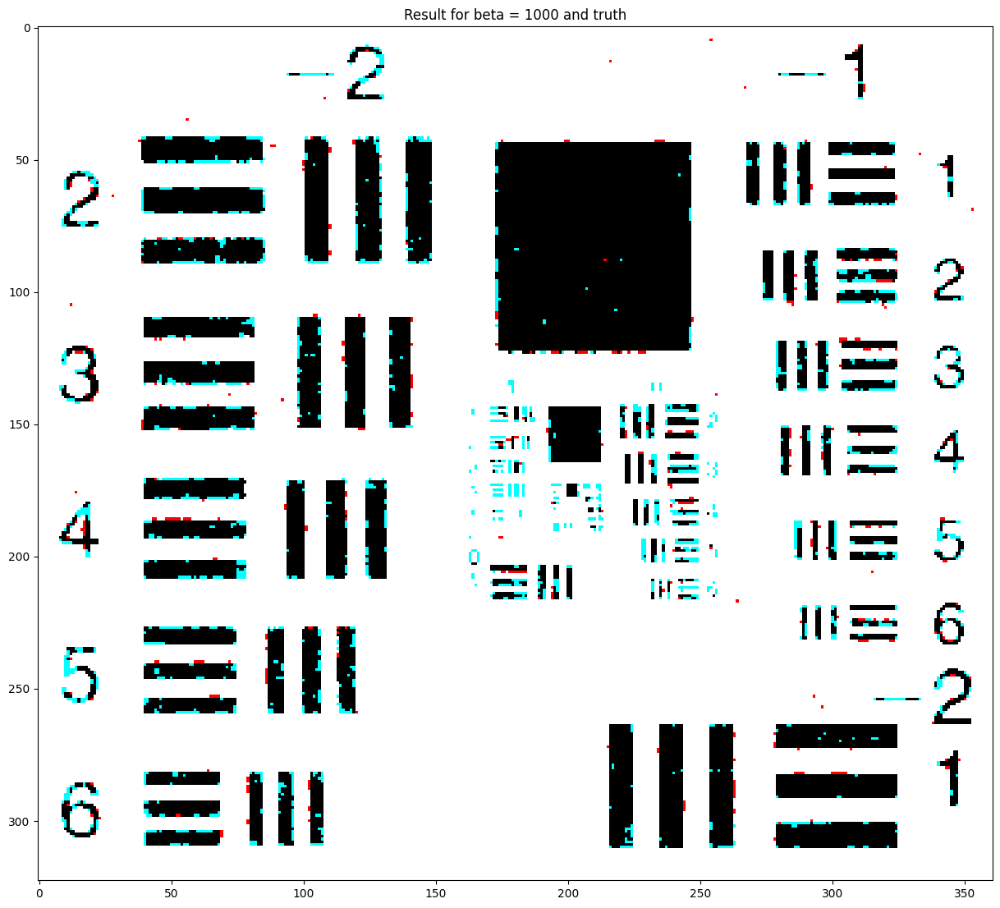

Number of misclassified pixels for beta =  1000 :  2845


In [7]:
# compute the error image between im_bin and im_orig (the ideal solution) using np.abs and np.sum
error = np.sum(np.abs(im_bin - im_orig))
plt.rcParams['figure.figsize'] = [15, 15]
# visualize the differences between the original image and the solution
plt.figure()
plt.imshow(np.dstack((np.int_(im_orig), im_bin, im_bin))*255)
plt.title("Result for beta = " + str(beta) + " and truth")
plt.show()

print("Number of misclassified pixels for beta = ",beta,": ",int(error))

### Search for the best parameter $\beta$

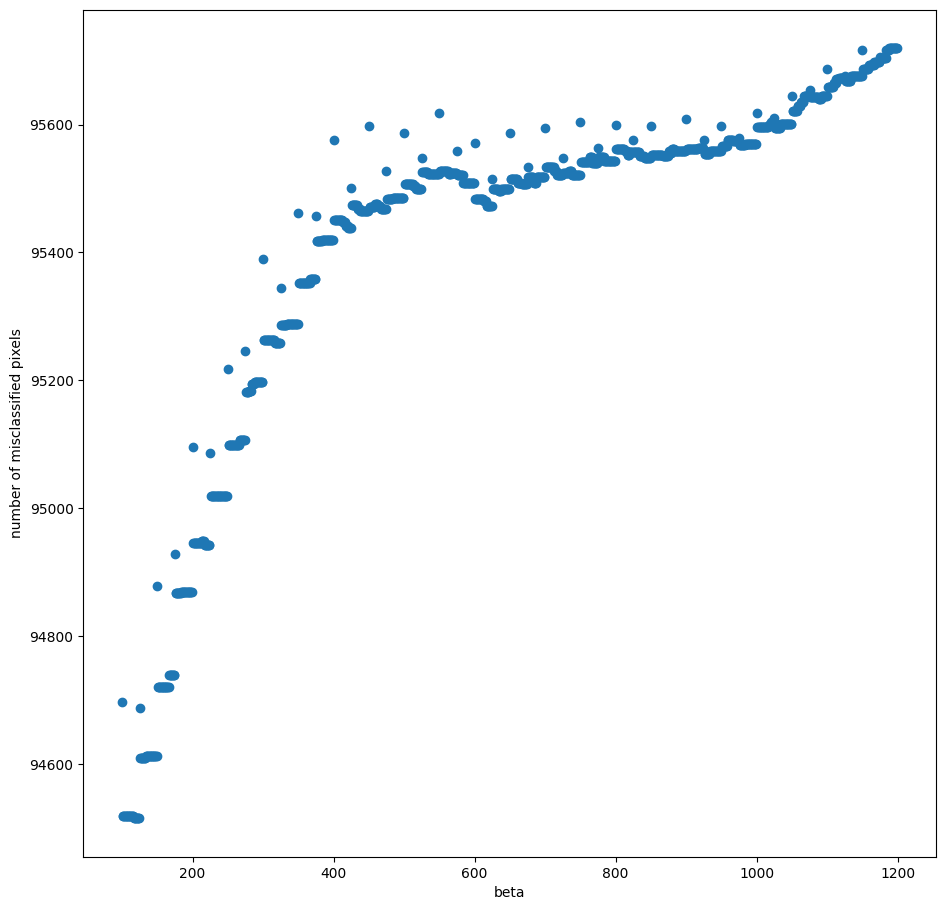

Best beta value:  117


In [27]:
im_obs=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Iobservee.png") # Observed image, noisy
im_orig=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/IoriginaleBW.png") # Binary reference image, to assess the quality of the segmentation
im_orig = im_orig/255

list_beta = list(range(100,1200))
list_errors = []

# TO BE COMPLETED - choose a range of values and a step to study beta
for beta in list_beta:
    # TO BE COMPLETED
    m0 = 100.0
    m1 = 150.0

    ## Binary graph cut

    # Create the graph
    g = maxflow.Graph[float]() # graph instantiation

    # Add the nodes. nodeids has the identifiers of the nodes in the grid.
    nodeids = g.add_grid_nodes(im_obs.shape)
    # Add non-terminal edges with the same capacity.
    g.add_grid_edges(nodeids,beta)
    # Add the terminal edges.
    #TO BE COMPLETED
    g.add_grid_tedges(nodeids,(im_obs-m0)**2 , (im_obs-m1)**2)

    # Find the maximum flow.
    flow = g.maxflow()

    # Get the segments of the nodes in the grid.
    sgm = g.get_grid_segments(nodeids)
    # create the output image
    im_bin = np.int_(np.logical_not(sgm))

    # compute the error
    #TO BE COMPLETED
    error = np.sum(np.abs(im_bin-im_orig))
    list_errors.append(error)


plt.figure()
plt.scatter(list_beta,list_errors)
plt.xlabel("beta")
plt.ylabel("number of misclassified pixels")
plt.show()

best_beta = list_beta[np.argmin(np.array(list_errors))]

print('Best beta value: ', best_beta)


## 2. Classification of a colour image

The objective of this part is to carry out an extension of the method seen previously in the case of the treatment of a colour image *avions.png* in which one wants to separate the objects from the background.

We will first use the same framework (Ising model) as before but with a three-dimensional data attachment (assuming convariance matrices equal to the identity). Then we will introduce a CRF (conditional random field) by weighting the regularisation term of the Ising model by the modulus of the gradient between two pixels of the observed image.  

### 2.1 Binary classification with Ising model
From the program structure below, carry out the different steps necessary for this classification:
1. Modelling of the background and object distributions (in 3 dimensions this time)
1. Definition of the data attachment term
1. Choice of a value for the regularisation parameter for the Ising model
1. Finding the minimal cut to obtain the object/background classification.

Q9: Comment on these steps and the results obtained.

**Your answer &#x270D;**

A9: To perform this classification, we first calculate the mean color values of the sky and the airplanes for each color component (red, green, and blue) separately. The data attachment term is modeled as the sum of squared differences, assuming there is no correlation between the three color components.

For the regularization term, we experimented with different values of the regularization parameter to prevent misclassifications, such as confusing the sky with the airplanes. This process yielded acceptable results overall, though there were some minor classification errors near the edges of the airplanes.

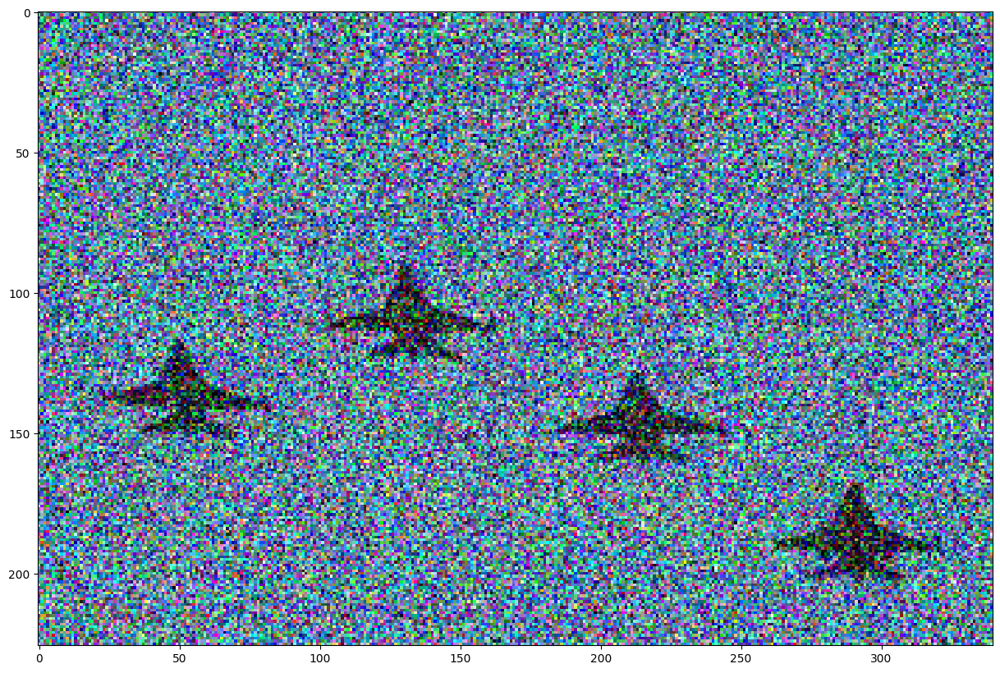

In [9]:
# Loading and displaying the image
#im_planes=io.imread('https://www.dropbox.com/s/ylm0ut8ipu5oonb/avions.png?dl=1')
im_planes=io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/planes.png")

plt.figure()
#plt.imshow(im_obs,vmin=0,vmax=255)
plt.rcParams['figure.figsize'] = [15, 15]
plt.imshow(im_planes)
plt.show()

#### Determining the parameters of the classes


Plane class: we can use the values of the rectangle [180:200,280:300].

example 1: np.mean(image[180:200,280:300,1]) returns the average of the selected area for channel 1.

example 2: np.mean(image[180:200,280:300,:], axis=(0, 1)) returns the average over the two first axis (height and width) of the selected area, which is here a np.array of size (3,).

In [10]:
# mean of the plane class - 3D vector
# TO BE COMPLETED

m_planes = [np.mean(im_planes[180:200,280:300,0]), np.mean(im_planes[180:200,280:300,1]), np.mean(im_planes[180:200,280:300,2])]

# mean of the sky class
# you can use values in the following square [0:100,150:300]
# TO BE COMPLETED
m_sky = [np.mean(im_planes[0:100,150:300,0]), np.mean(im_planes[0:100,150:300,1]),np.mean(im_planes[0:100,150:300,2])]

print('For the sky, [R,G,B] = ', m_sky)
print("For the planes, [R,G,B] = ", m_planes)

# check that the obtained values are coherent

For the sky, [R,G,B] =  [93.96126666666666, 127.14426666666667, 156.2286]
For the planes, [R,G,B] =  [53.645, 56.4725, 70.2075]


In [11]:
#affiche(im_bin, titre="Result for beta = " + str(beta));
# choose a beta value

beta = 10000
im_obs = im_planes


## Binary graph cut

# Create the graph
g = maxflow.Graph[float]() # graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(im_obs.shape[0:2])
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids,beta)
# Add the terminal edges.
g.add_grid_tedges(nodeids,np.sum((im_planes - m_planes)**2, axis=-1),np.sum((im_planes - m_sky)**2, axis=-1))

# Find the maximum flow.
flow = g.maxflow()
print("Max Flow:", str(flow))
# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
# create the output image
im_bin = np.int_(np.logical_not(sgm))

Max Flow: 1087424855.1529853


In [12]:
affiche(im_bin)

### 2.2 Use of a CRF (Conditional Random Field) model

We will try here to adapt the model used previously to favour transitions where they are compatible with the gradient. To do this, we will replace the constant $\beta$ for the whole image by a "beta_field" which depends on the norm of the gradient.

Q10: Calculate and display the modulus of the gradient of the aircraft image after it has been grayscaled and convolved by a Gaussian kernel of standard deviation 1. Why use the "boundary='symm'" option when convolving through the Sobel filter? Try it without doing the Gaussian filtering. What is the point?

**Your answer &#x270D;**

A10: The option `boundary='symm'` is used to handle edge effects during convolution. Without it, artifacts may appear at the image boundaries, leading to the detection of false edges.

Gaussian filtering is essential to avoid detecting erroneous contours along the edges of the image. Without this filtering, the resulting gradient contains strong variations throughout the image, caused by intense local changes in grayscale levels. This makes the contours less discernible and leads to less satisfactory results. Applying the Gaussian filter smooths the image and reduces noise, making the gradient-based edge detection more reliable.

In [13]:
import scipy.signal
import scipy.ndimage
from skimage import color

def gradient(image):
    """ Array -> tuple[Array*Array]"""
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype = np.float64)
    sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype = np.float64)
    # to be completed
    # use mode = 'same' and boundary='symm' in scipy.signal.convolve2d
  
    derivative_x = scipy.signal.convolve2d(image, sobel_x, mode='same', boundary='symm')
    derivative_y = scipy.signal.convolve2d(image, sobel_y, mode='same', boundary='symm')
    return([derivative_x,derivative_y])

plane_nb = scipy.ndimage.gaussian_filter(color.rgb2gray(im_planes), 1)
plane_x, plane_y = gradient(plane_nb)
# calculation of the gradient modulus
# TO BE COMPLETED
grad_av = np.sqrt(plane_x**2+plane_y**2)
affiche(grad_av)


Complete the code for segmentation by CRF. We will choose $beta\_field=\beta_2\cdot\exp(-grad\_av/h)$. We can use $h=3$ and $\beta_2=20000$. Also replace the constant beta by the field "beta_field" during the "g.add_grid_edges" step.

Q11: Compare the results with and without the contour term.

**Your answer &#x270D;**

A11: By incorporating the gradient, we observe an improvement in edge detection. However, given the simplicity of the image, the difference is not highly significant. While this technique yields better results, the overall enhancement is relatively subtle and may not be immediately noticeable.

In [14]:
h = 300
beta2 = 10000
beta_field = beta2 * np.exp(-grad_av/h)

g = maxflow.Graph[float]()

nodeids = g.add_grid_nodes(im_planes.shape[0:2])

g.add_grid_edges(nodeids, beta_field)

g.add_grid_tedges(
    nodeids,
    (im_planes[:, :, 0] - m_sky[0])**2 + (im_planes[:, :, 1] - m_sky[1])**2 + (im_planes[:, :, 2] - m_sky[2])**2,
    (im_planes[:, :, 0] - m_planes[0])**2 + (im_planes[:, :, 1] - m_planes[1])**2 + (im_planes[:, :, 2] - m_planes[2])**2
)

flow = g.maxflow()

print("Max Flow:", str(flow))

sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

affiche(im_bin)

Max Flow: 1087401526.3621795


## 3. Iterative Segmentation with Gaussian Mixture

Q12: Display the "zebra" image below. Is it possible to segment the zebra with the method used to segment the planes?



**Your answer &#x270D;**

A12: Segmenting the zebra with the plane segmentation method is challenging due to the zebra's high-frequency stripes, which confuse the regularization and data attachment terms. A more texture-aware or advanced approach, would be better suited for this task.

uint8


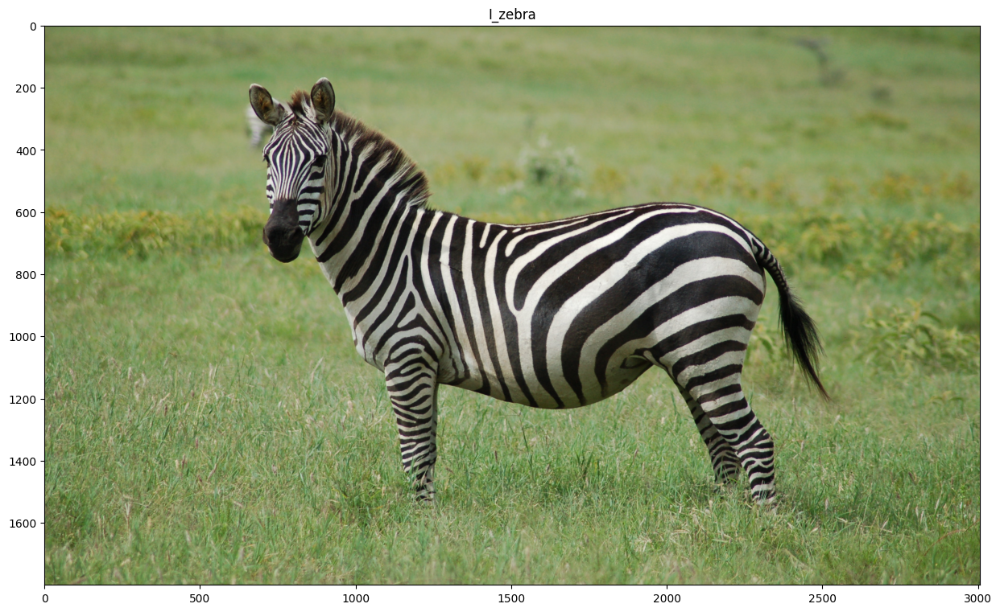

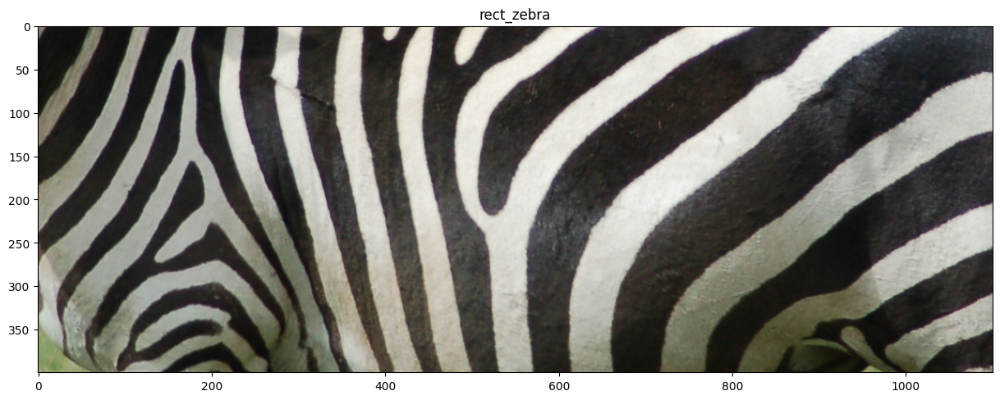

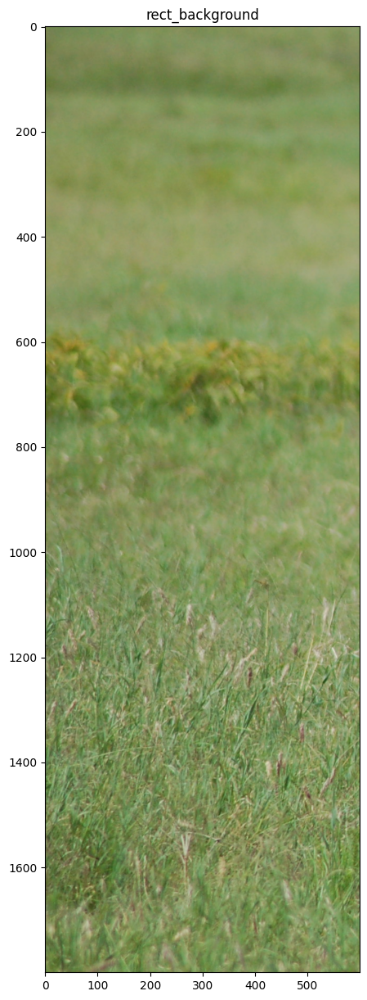

In [15]:
### Loading a new image
I_zebra = io.imread("https://perso.telecom-paristech.fr/tupin/cours/IMA203/TPMARKOV/Equus_quagga.jpg")
I_zebra = I_zebra[200:,:,:]
rect_zebra = I_zebra[700:1100,1000:2100]
rect_background = I_zebra[:,0:600]
print(I_zebra.dtype)

plt.figure()
plt.imshow(I_zebra)
plt.title('I_zebra')
plt.show()

plt.figure()
plt.imshow(rect_zebra)
plt.title('rect_zebra')
plt.show()

plt.figure()
plt.imshow(rect_background)
plt.title('rect_background')
plt.show()

Q13: Calculate the covariance matrix for the rect_zebra and the rect_background. Display the values and comment on the result. What do the diagonal values correspond to?

**Your answer &#x270D;**

A13: The diagonal values represent the variance of each color channel (Red, Green, Blue) in the respective region.
The off-diagonal values indicate the covariance or correlation between color channels. Higher values suggest that the channels are more strongly correlated, which is observed in the zebra stripes.
The zebra region shows significantly higher color variation than the background region, which is expected due to the striped texture.

In [16]:
print(I_zebra.shape)
V_tulip = np.vstack([I_zebra[:,:,i].flatten() for i in range(3)])
print(I_zebra.shape)

M_cov = np.cov(np.vstack([I_zebra[:,:,i].flatten() for i in range(3)]))
print('Full zebra image')
print(M_cov)

M_cov = np.cov(np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]))
print('Rectangle zebra')
print(M_cov)

M_cov = np.cov(np.vstack([rect_background[:,:,i].flatten() for i in range(3)]))
print('Rectangle background')
print(M_cov)

(1800, 3008, 3)
(1800, 3008, 3)
Full zebra image
[[1505.54438095 1533.04278068 1229.71568017]
 [1533.04278068 1691.10755214 1221.09280991]
 [1229.71568017 1221.09280991 1210.38328951]]
Rectangle zebra
[[5504.73383563 5535.4436469  5290.02896111]
 [5535.4436469  5588.18500866 5329.06646681]
 [5290.02896111 5329.06646681 5143.99751626]]
Rectangle background
[[313.37936128 226.13253307 255.56699124]
 [226.13253307 219.38193629 221.71082516]
 [255.56699124 221.71082516 308.63086939]]


Q14: Display the histogram for the R, G and B channels for the "rect_zebra" image. Comment on the result.

**Your answer &#x270D;**

A14: We can observe that the histograms are not perfectly uniform, as the zebra's stripes introduce variations in intensity across the three color channels. The histograms reflect the varying brightness of the black and white stripes in the rect_zebra region.

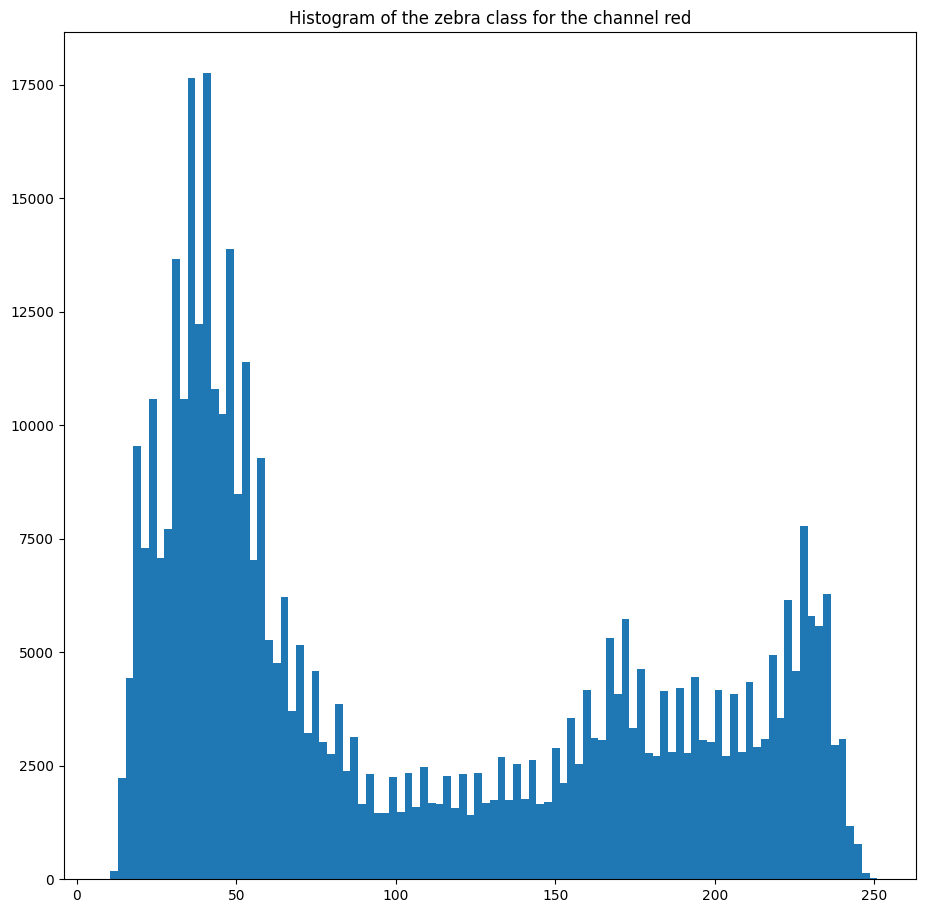

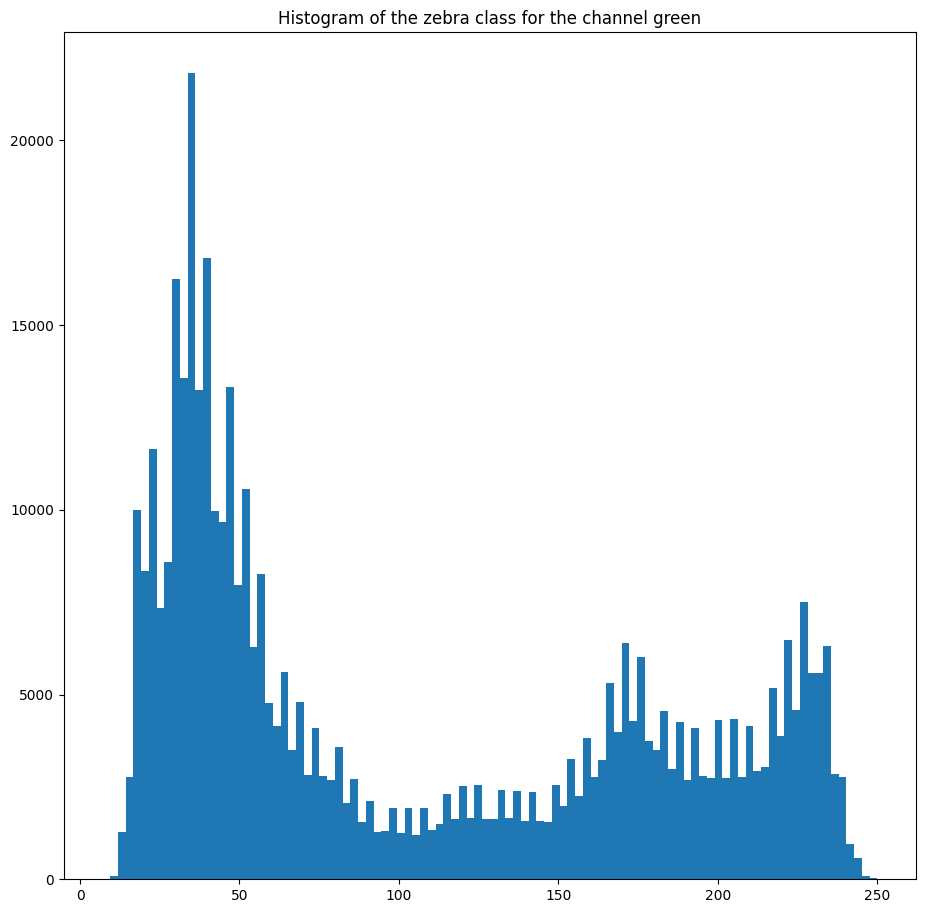

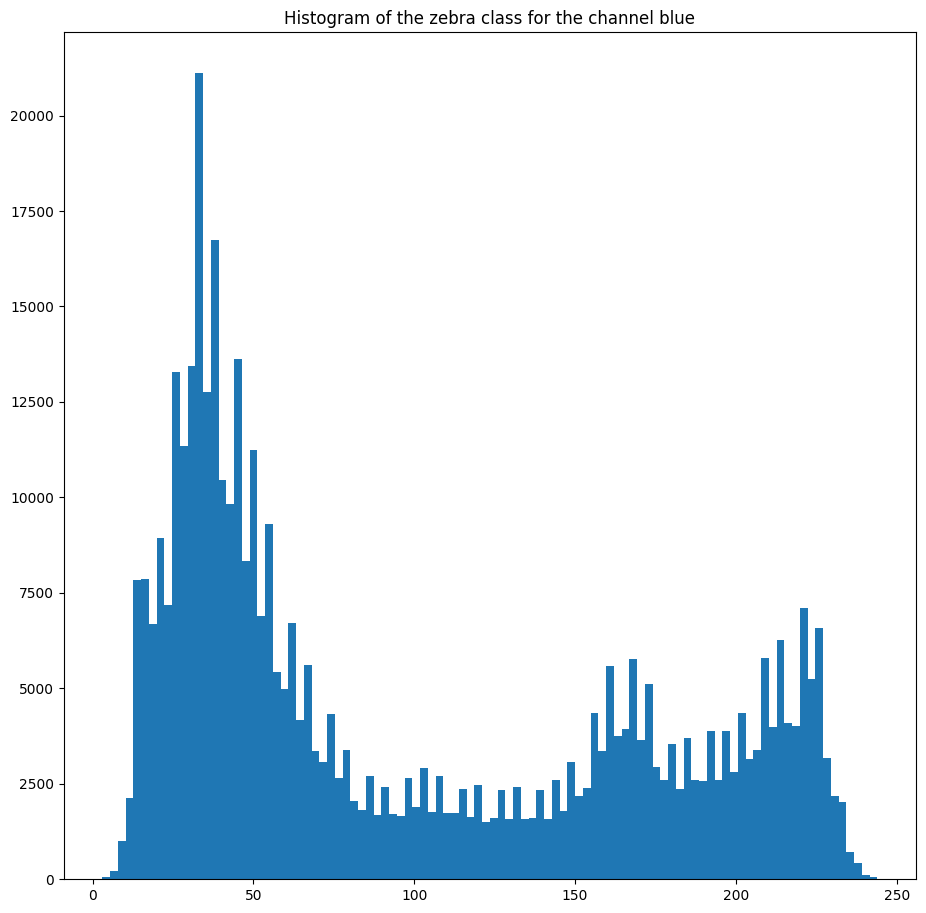

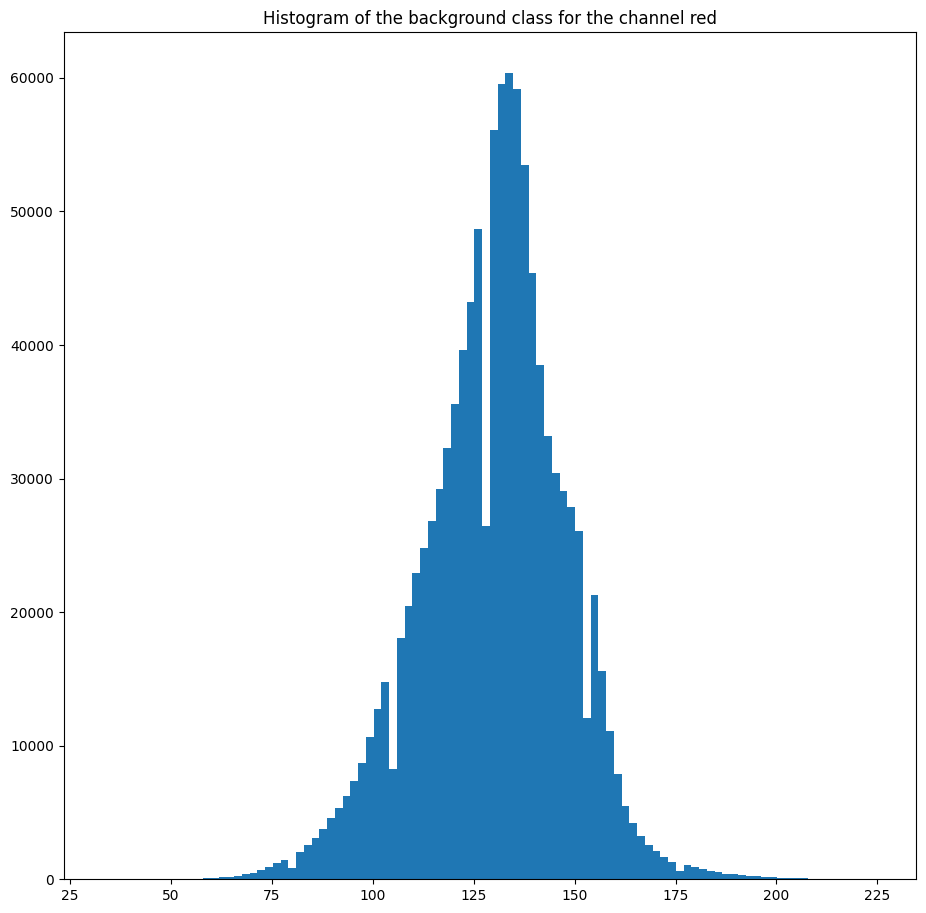

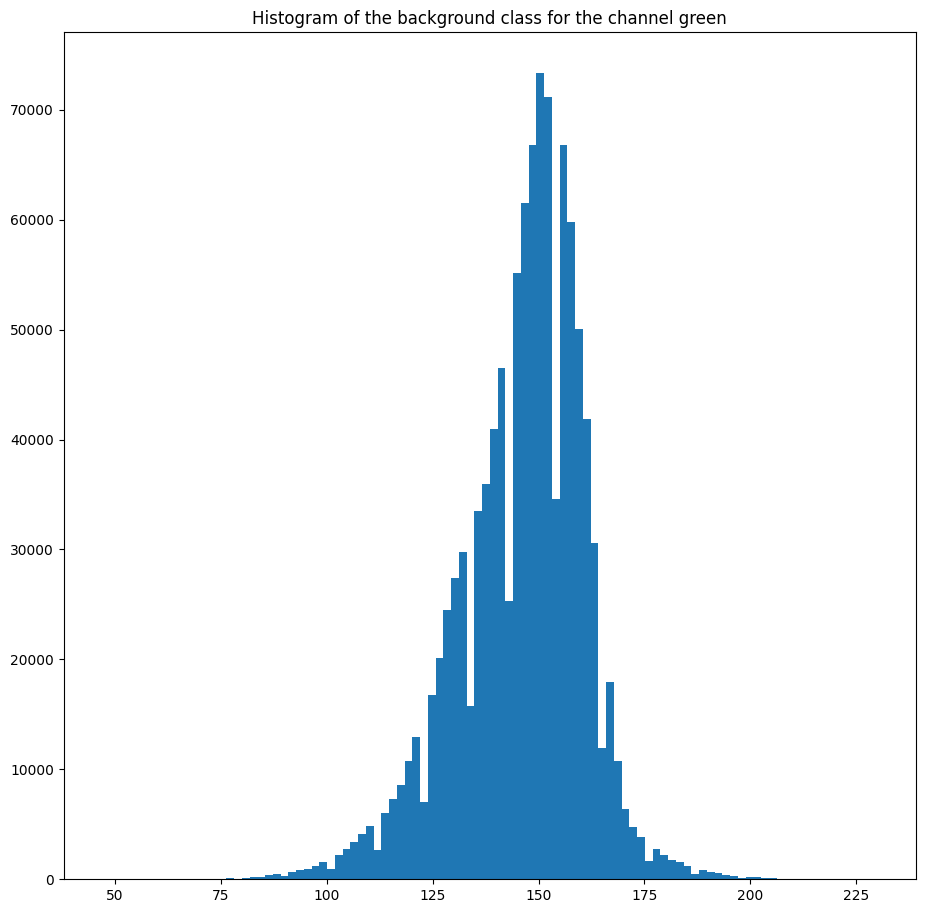

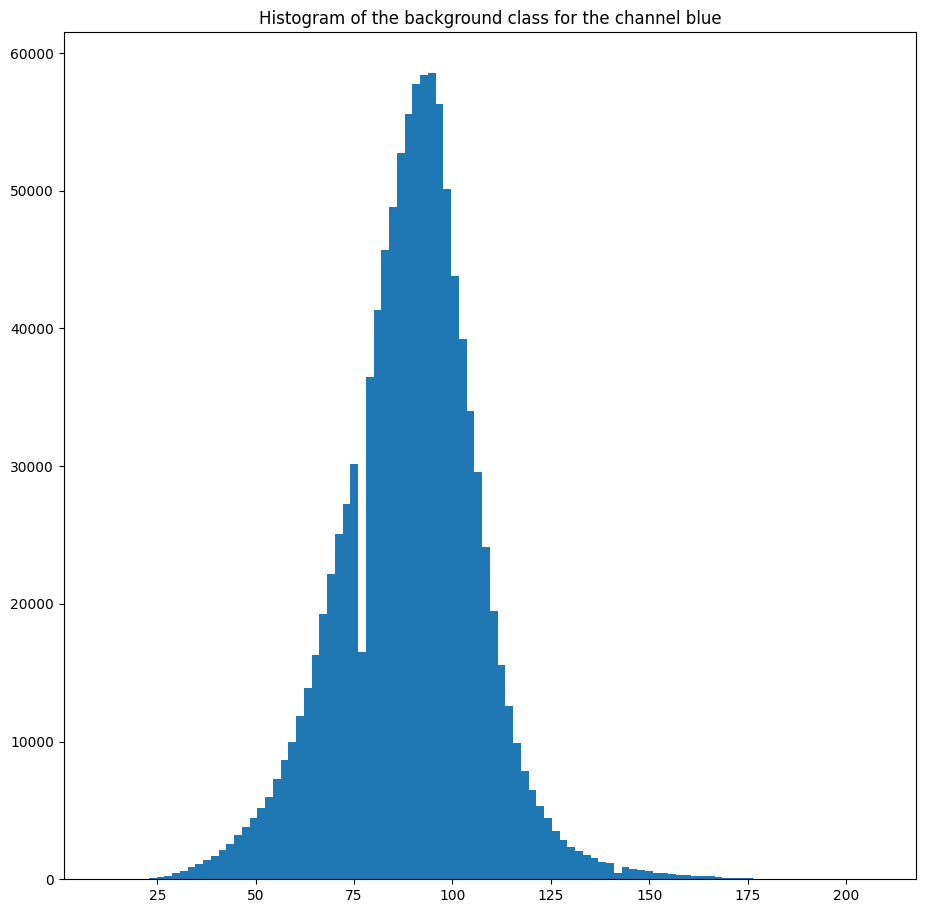

In [17]:
# allows you to change the display size of plt.show
plt.rcParams['figure.figsize'] = [11, 11]

nomchan = ["red","green", "blue"]
for chan in range(3):
    plt.figure()
    plt.hist(rect_zebra[:,:,chan].flatten(),100)
    plt.title("Histogram of the zebra class for the channel " + nomchan[chan])
    plt.show()


for chan in range(3):
    plt.figure()
    plt.hist(rect_background[:,:,chan].flatten(),100)
    plt.title("Histogram of the background class for the channel " + nomchan[chan])
    plt.show()

Q15: Propose an algorithmic method to identify the two classes of the image "rect_zebra". Use a sklearn implementation of this algorithm to identify the mean vectors ($m_R$,$m_G$,$m_B$) for two classes of the "rect_zebra" image and two classes of the "rect_background" image.

*The following line of code can be used to transform the image into a suitable form.*

X = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()

Comment on the average vectors obtained. They can be displayed as an image using the code provided.

**Your answer &#x270D;**

A15:

In [18]:
# computation of class parameters in a semi-automatic way
from sklearn.cluster import KMeans
import numpy as np

# Use a number of clusters = 2 for the zebra part
X_zebra = np.vstack([rect_zebra[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_zebra = KMeans(n_clusters=2, n_init=10).fit(X_zebra)
mean_vectors_zebra = kmeans_zebra.cluster_centers_

# Use a number of clusters = 2 for the background part
X_background = np.vstack([rect_background[:,:,i].flatten() for i in range(3)]).transpose()
kmeans_background = KMeans(n_clusters=2, n_init=10).fit(X_background)
mean_vectors_background = kmeans_background.cluster_centers_

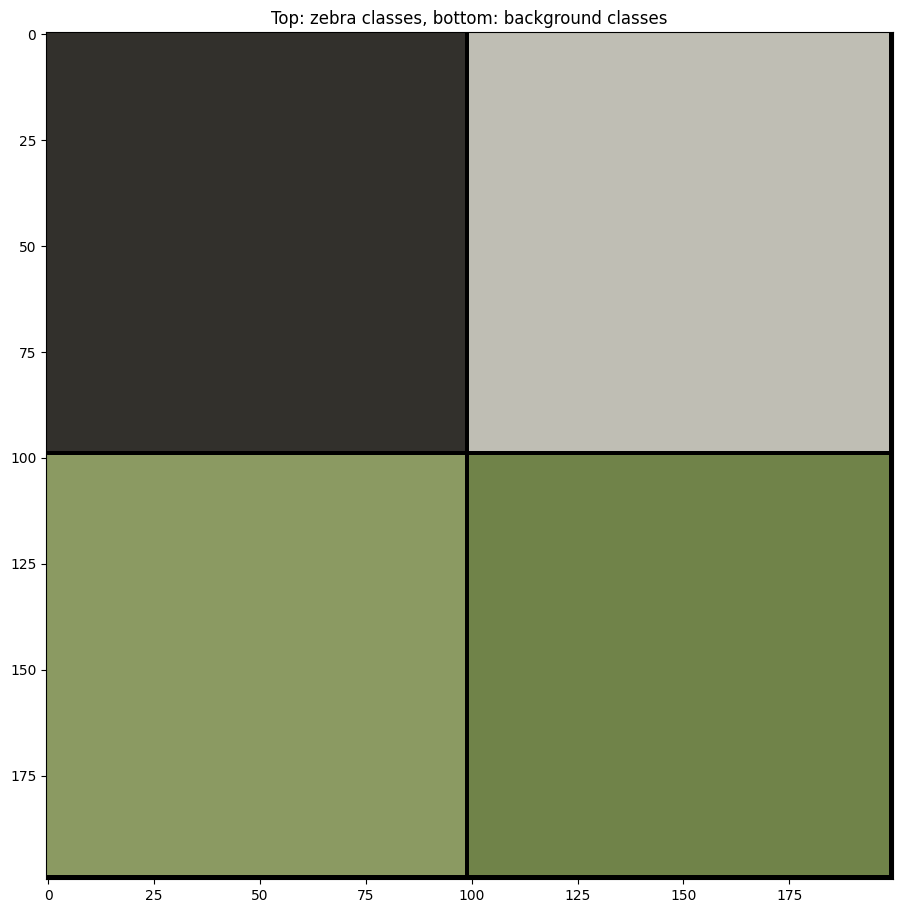

In [19]:
# display of the class centers found as an image
image_mean_vectors = np.zeros((200,200,3),np.uint8)
for i in range(3):
    image_mean_vectors[0:99,0:99,i] = mean_vectors_zebra[0,i]
    image_mean_vectors[0:99,100:199,i] = mean_vectors_zebra[1,i]
    image_mean_vectors[100:199,0:99,i] = mean_vectors_background[0,i]
    image_mean_vectors[100:199,100:199,i] = mean_vectors_background[1,i]

plt.figure()
plt.imshow(image_mean_vectors,vmax = 255)
plt.title("Top: zebra classes, bottom: background classes")
plt.show()

Q16: Display separately two neg-log-likelihood images (the neg-log-likelihood was used as a data attachment in the previous example) for the two zebra classes.
Build a neg-log-likelihood image corresponding to the minimum of the two neg-log-likelihoods of the zebra classes. Similarly for the background class.

Display them and comment.

**Your answer &#x270D;**

A16: The two neg-log-likelihood images for the zebra classes show how closely each pixel matches the respective zebra class. The combined image, using the minimum of the two, highlights the best match for each pixel, providing a more accurate segmentation of the zebra.

Similarly, the background class images reflect the match to the two background classes. Combining them in the same way yields the best fit for the background, aiding in the segmentation of zebra and background.

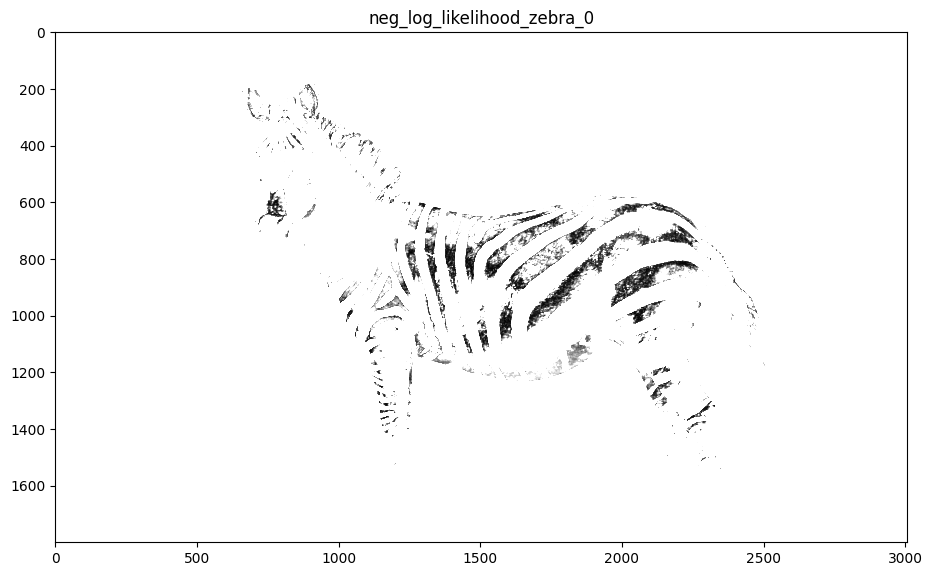

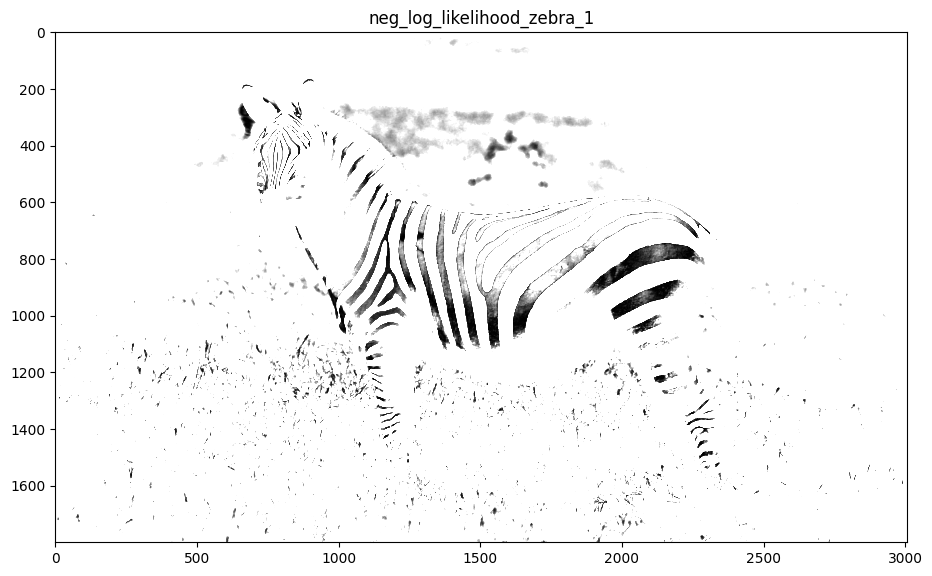

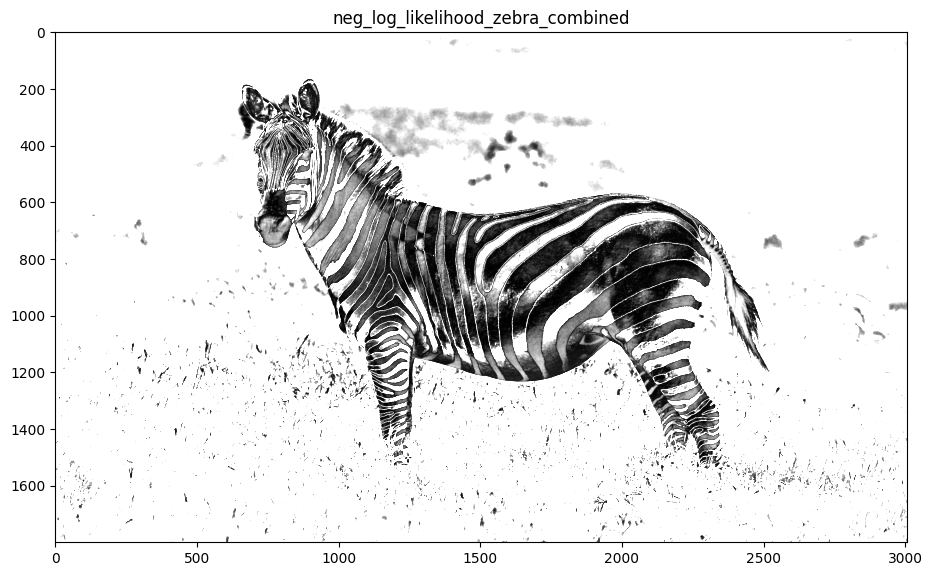

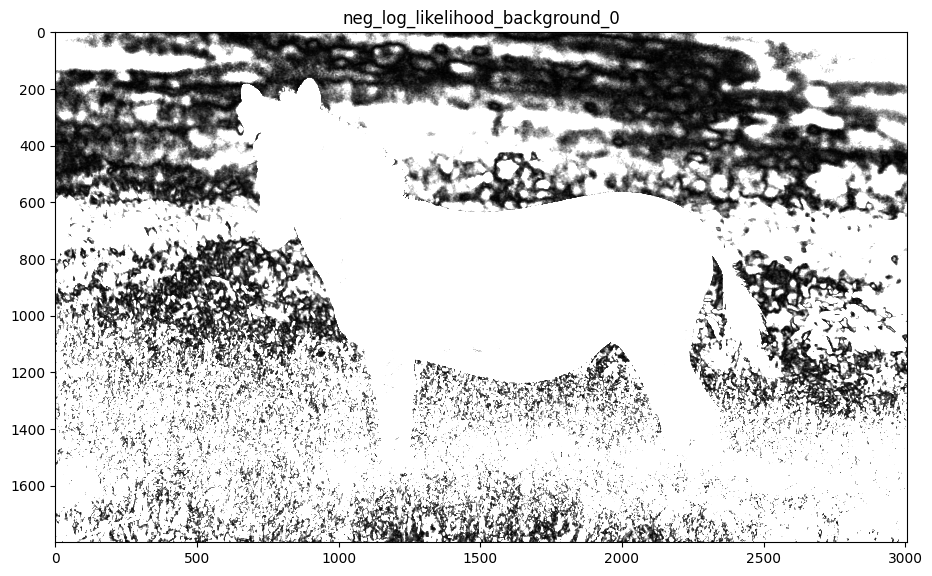

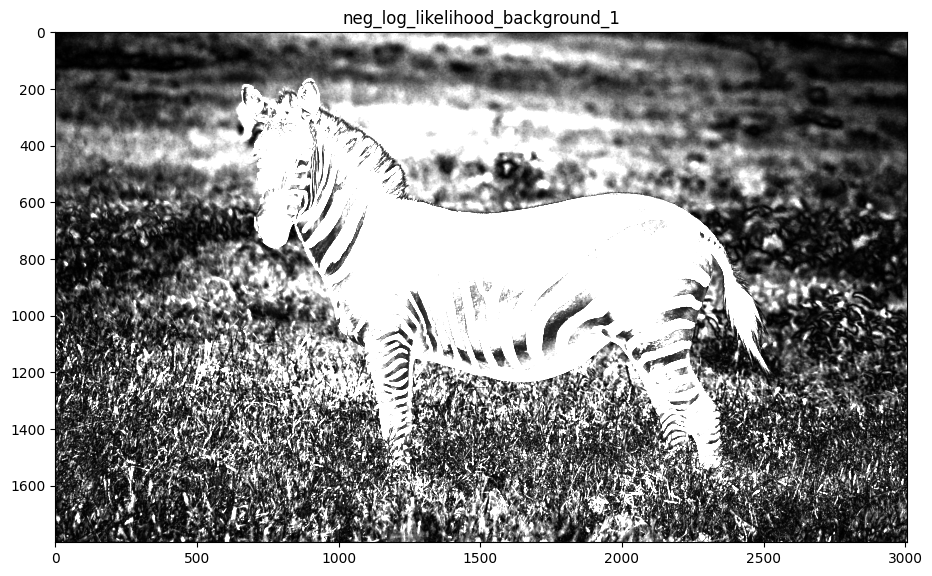

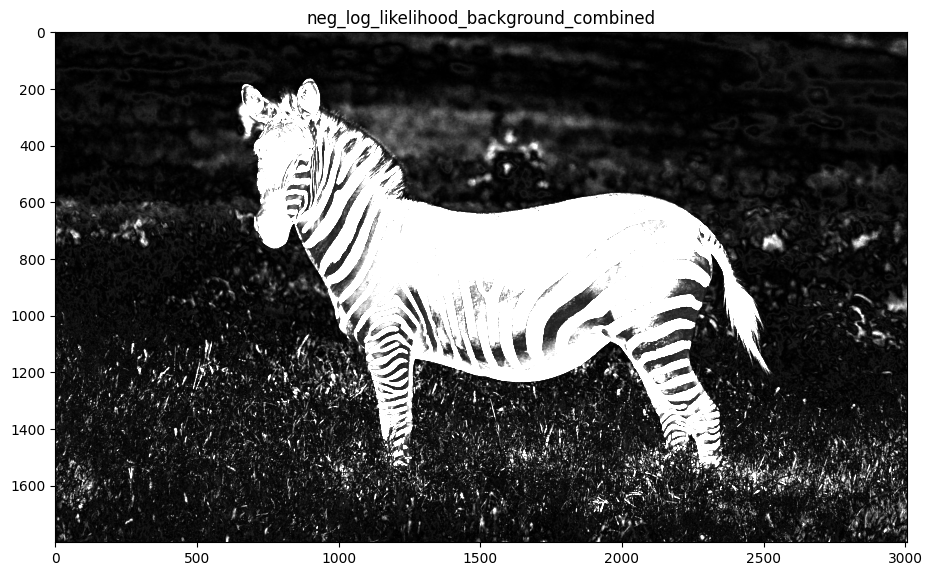

In [20]:
# Calculation of the neg-log-likelihood of the zebra class
neg_log_likelihood_zebra_0 = sum((I_zebra[:,:,i]-mean_vectors_zebra[0,i])**2 for i in range(3))
plt.figure()
plt.imshow(neg_log_likelihood_zebra_0, cmap='gray', vmax=600)
plt.title("neg_log_likelihood_zebra_0")
plt.show()

neg_log_likelihood_zebra_1 = sum((I_zebra[:,:,i]-mean_vectors_zebra[1,i])**2 for i in range(3))
plt.figure()
plt.imshow(neg_log_likelihood_zebra_1, cmap='gray', vmax=5000)
plt.title("neg_log_likelihood_zebra_1")
plt.show()

neg_log_likelihood_zebra_combined = np.minimum(neg_log_likelihood_zebra_0, neg_log_likelihood_zebra_1)
plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined, cmap='gray', vmax=5000)
plt.title("neg_log_likelihood_zebra_combined")
plt.show()

# Calculation of the neg-log-likelihood of the background class
neg_log_likelihood_background_0 = sum((I_zebra[:,:,i] - mean_vectors_background[0,i])**2 for i in range(3))
plt.figure()
plt.imshow(neg_log_likelihood_background_0, cmap='gray', vmax=600)
plt.title("neg_log_likelihood_background_0")
plt.show()

neg_log_likelihood_background_1 = sum((I_zebra[:,:,i] - mean_vectors_background[1,i])**2 for i in range(3))
plt.figure()
plt.imshow(neg_log_likelihood_background_1, cmap='gray', vmax=5000)
plt.title("neg_log_likelihood_background_1")
plt.show()

# Combine the two background classes
neg_log_likelihood_background_combined = np.minimum(neg_log_likelihood_background_0, neg_log_likelihood_background_1)
plt.figure()
plt.imshow(neg_log_likelihood_background_combined, cmap='gray', vmax=5000)
plt.title("neg_log_likelihood_background_combined")
plt.show()

Q17: From these combined data attachment images (one for the background and one for the zebra), set up a graph-cut segmentation of the image with the $\beta$ of your choice. Comment the result.

**Your answer &#x270D;**

A17: Using the combined data attachment images for both the background and the zebra, and applying a graph-cut segmentation with an optimal β value, the segmentation produces clearer boundaries between the zebra and the background. The result effectively distinguishes the two classes, with sharper transitions where the classes meet, but it may still struggle with fine details or areas where the intensity variation is subtle.

Max Flow: 4695137175.973457


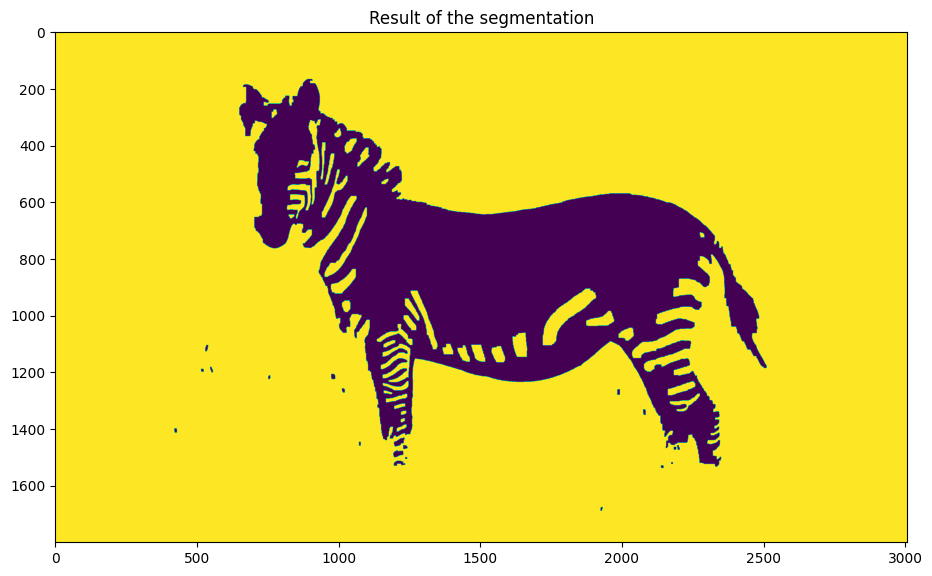

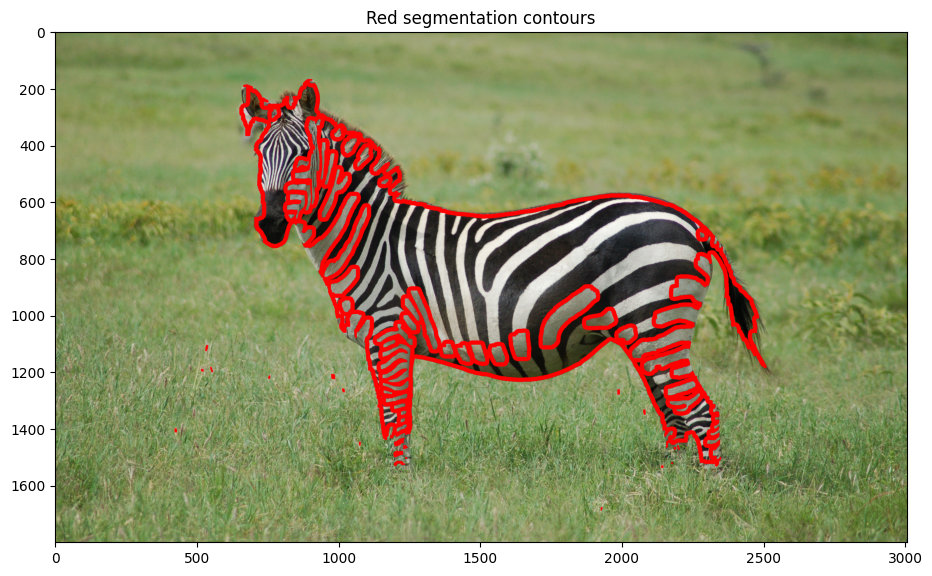

In [21]:
beta = 20000  # Optimal beta value to be determined

## Binary graph cut

# Create the graph.
g = maxflow.Graph[float]()  # Graph instantiation
# Add the nodes. nodeids has the identifiers of the nodes in the grid.
nodeids = g.add_grid_nodes(I_zebra.shape[0:2])  # Create a grid with a non-terminal node for each pixel in the image
# Add non-terminal edges with the same capacity.
g.add_grid_edges(nodeids, beta)  # Addition of a beta weight edge between each adjacent node according to the 4-connexity

# Add the terminal edges.
# Calculate the data attachment for the zebra and background (using the previously computed neg-log-likelihoods)
g.add_grid_tedges(nodeids.flatten(), neg_log_likelihood_zebra_combined.flatten(), neg_log_likelihood_background_combined.flatten())

# Find the maximum flow.
flow = g.maxflow()

print("Max Flow:", str(flow))

# Get the segments of the nodes in the grid.
sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

# Display the segmentation result
plt.figure()
plt.imshow(im_bin)
plt.title("Result of the segmentation")
plt.show()

# Display the segmentation contours
plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red segmentation contours")
plt.show()

Q18: From the obtained segmentation, determine the mean vectors for 5 classes for the background and 5 classes for the zebra. Use these lists of mean vectors to construct new neg-log-likelihood combination images. Comment on them.

**Your answer &#x270D;**

A18: The segmentation results, based on the 5 classes for both the zebra and background, provide distinct mean vectors for each class. When used to construct new neg-log-likelihood combination images, these images show clearer separations between the zebra and background regions. The updated images reflect the segmentation more accurately by accounting for variations within both the zebra and background, resulting in better-defined class boundaries.

In [22]:
# The computing of this cell can take several minutes.

X_1 = np.vstack([I_zebra[im_bin==1,i].flatten() for i in range(3)]).transpose()
kmeans_zebra2 = KMeans(n_clusters=5, random_state=0, n_init=10).fit(X_1)
mean_vectors_zebra2 = kmeans_zebra2.cluster_centers_

X_2 = np.vstack([I_zebra[im_bin==0,i].flatten() for i in range(3)]).transpose()
kmeans_background2 = KMeans(n_clusters=5, random_state=0, n_init=10).fit(X_2)
mean_vectors_background2 = kmeans_background2.cluster_centers_

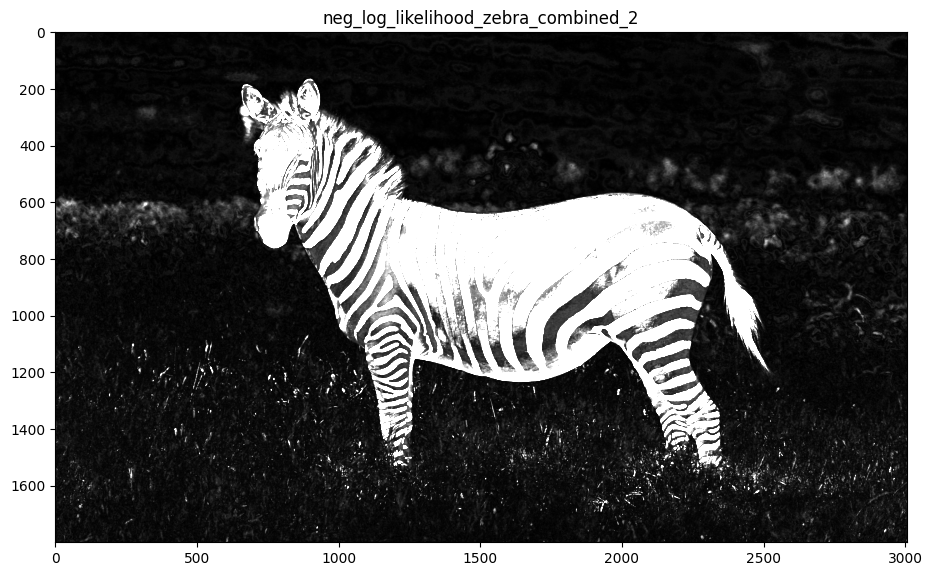

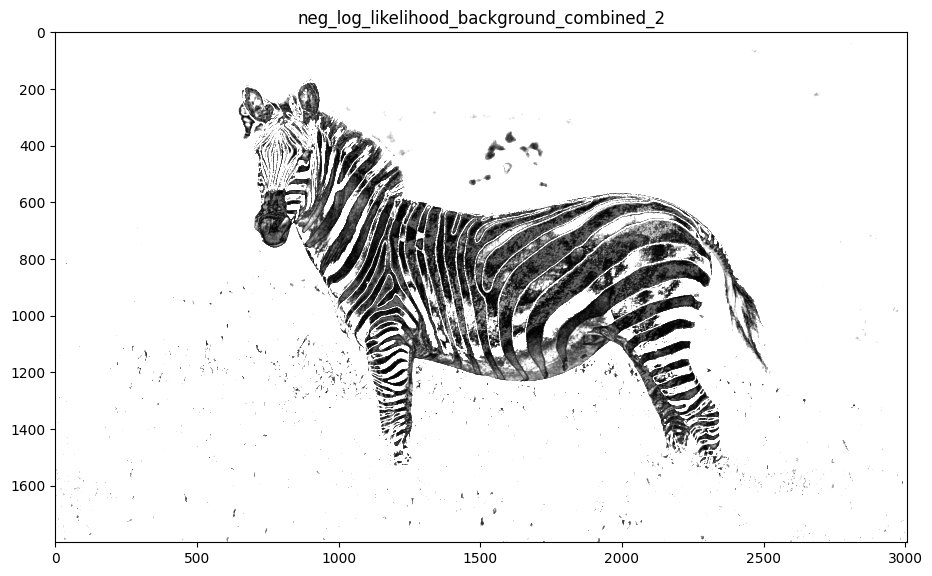

In [23]:
neg_log_likelihood_zebra_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_zebra2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_zebra2))]),2)

neg_log_likelihood_background_combined_2 = np.amin(np.dstack([(sum((I_zebra[:,:,i]-mean_vectors_background2[n_cl,i])**2 for i in range(3))) for n_cl in range(len(mean_vectors_background2))]),2)

plt.figure()
plt.imshow(neg_log_likelihood_zebra_combined_2 ,cmap='gray', vmax = 3000)
plt.title("neg_log_likelihood_zebra_combined_2")
plt.show()

plt.figure()
plt.imshow(neg_log_likelihood_background_combined_2,cmap='gray', vmax = 1000)
plt.title("neg_log_likelihood_background_combined_2")
plt.show()


Q19: From these neg-log-likelihood images, segment the image by graph-cut using a new value of $\beta$ that gives you the best result. Comment on the result and the new value of $\beta$ that allowed you to obtain it. What about the new 5-class data attachment compared to the previous one?

**Your answer &#x270D;**

A19: By applying a new $\beta$ value optimized for the segmentation, we observe a more accurate separation between the zebra and background classes. The new $\beta$ value helps balance the data attachment and regularization, providing a more refined segmentation, especially in areas with complex textures. Compared to the previous 5-class data attachment, the new one allows for better distinction of regions, though the result still depends on how well the mean vectors for each class are chosen.

Max Flow: 1691618154.8127244


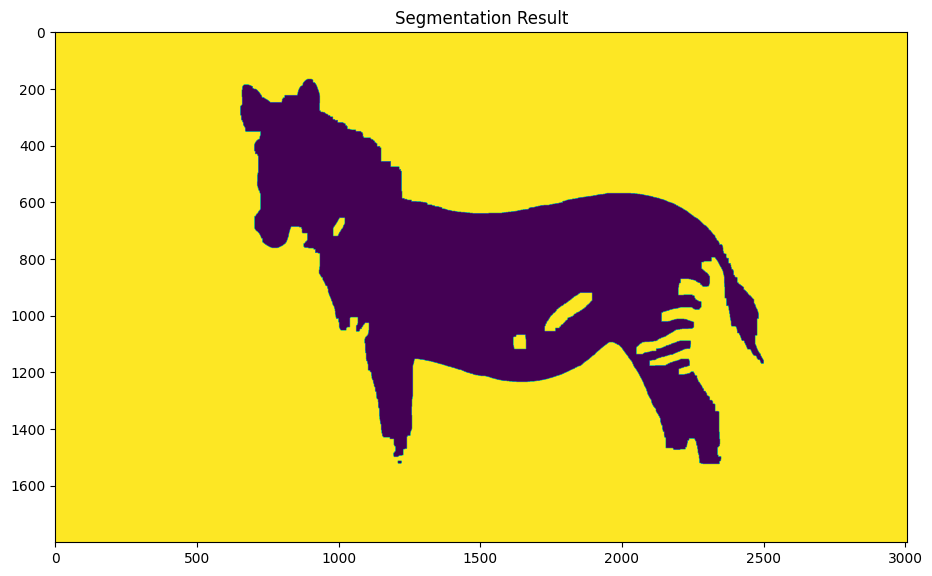

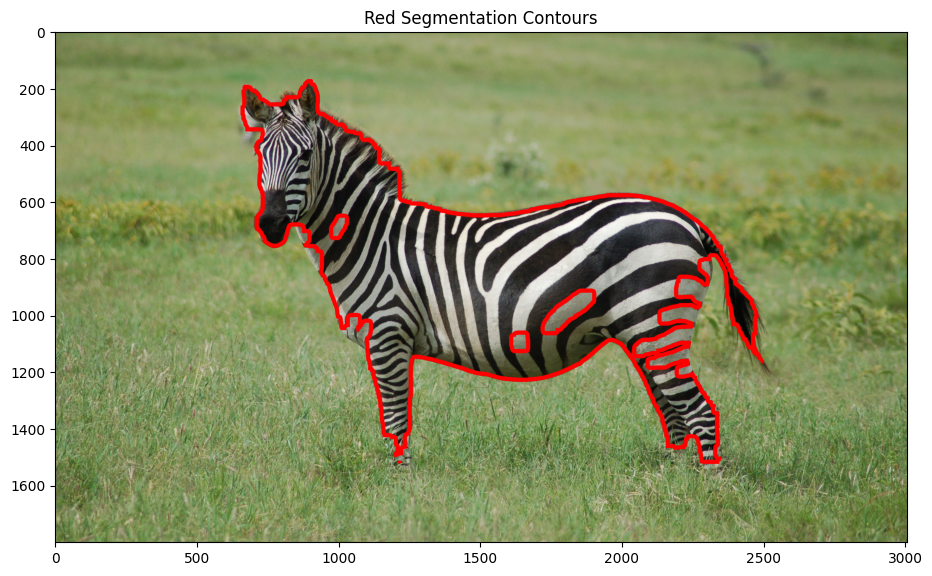

In [26]:
beta = 22000

g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(I_zebra.shape[0:2])
g.add_grid_edges(nodeids, beta)
g.add_grid_tedges(nodeids.flatten(), neg_log_likelihood_background_combined_2.flatten(), neg_log_likelihood_zebra_combined_2.flatten())

flow = g.maxflow()

print("Max Flow:", str(flow))

sgm = g.get_grid_segments(nodeids)
im_bin = np.int_(np.logical_not(sgm))

plt.figure()
plt.imshow(im_bin)
plt.title("Segmentation Result")
plt.show()

plt.figure()
plt.imshow(display_segmentation_borders(I_zebra, im_bin))
plt.title("Red Segmentation Contours")
plt.show()